In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import parent

In [2]:
import data

In [3]:
d1_triangles, d2_triangles = data.get_dataset_triangles("train")
image_A, image_B = (x[0].cuda() for x in next(zip(d1_triangles, d2_triangles)))

In [4]:
from visualize import *

In [5]:
data_shape = [8, 1, 128, 128]
from torch import nn
from mermaidlite import *
class InverseConsistentLearningFree(nn.Module):
    def __init__(self, lmbda, noise=0):
        super(InverseConsistentLearningFree, self).__init__()
        self.sz = np.array(data_shape)
        self.spacing = 1./(self.sz[2::]-1) 
        
        self.noise = noise
        
        _id = identity_map_multiN(self.sz, self.spacing)
        self.identityMap = torch.from_numpy(_id).cuda()
        #The displacement map from image A to image B.
        self.register_parameter(name="D_AB",
            param=torch.nn.Parameter(torch.zeros([8, 2, 128, 128])))
        #and vice versa
        self.register_parameter(name="D_BA",
            param=torch.nn.Parameter(torch.zeros([8, 2, 128, 128])))
        self.lmbda = lmbda
        
        self.random_sampling=True
    def forward(self, image_A, image_B):
        self.D_AB_noise = self.D_AB + self.noise * torch.randn([8, 2, 128, 128]).cuda()
        self.D_BA_noise = self.D_BA + self.noise * torch.randn([8, 2, 128, 128]).cuda()
        self.phi_AB = self.D_AB_noise + self.identityMap
        self.phi_BA = self.D_BA_noise + self.identityMap
        
        self.warped_image_A = compute_warped_image_multiNC(
            image_A, self.phi_AB, self.spacing, 1)
        
        self.warped_image_B = compute_warped_image_multiNC(
            image_B, self.phi_BA, self.spacing, 1)
        
        

        
        Iepsilon = (
            self.identityMap 
            + torch.randn([8, 2, 128, 128]).cuda() * 1/128
        )        
        D_BA_epsilon = compute_warped_image_multiNC(self.D_BA_noise, Iepsilon, 
                                                    self.spacing, 1)
        
        D_AB_epsilon = compute_warped_image_multiNC(self.D_AB_noise, Iepsilon, 
                                                    self.spacing, 1)
        
        self.approximate_identity_ABBA = compute_warped_image_multiNC( 
                self.D_AB_noise, D_BA_epsilon + Iepsilon, self.spacing, 1
            ) + D_BA_epsilon
        
        self.approximage_identity_BAAB = compute_warped_image_multiNC(
                self.D_BA_noise, D_AB_epsilon + Iepsilon, self.spacing, 1
        ) + D_AB_epsilon 
        
        inverse_consistency_loss = self.lmbda * (
            torch.mean(self.approximate_identity_ABBA**2) 
            + torch.mean(self.approximage_identity_BAAB**2)
        )
        similarity_loss = (
            torch.mean((self.warped_image_A - image_B)**2) + 
            torch.mean((self.warped_image_B - image_A)**2)
        )
        
        transform_magnitude= self.lmbda * torch.mean(
            (self.identityMap - self.phi_AB)**2
        )
        self.all_loss =  inverse_consistency_loss + similarity_loss
        return [x.item() for x in 
                (inverse_consistency_loss, 
                 similarity_loss, 
                 transform_magnitude)
               ]
        

In [6]:
def train_no_learning(net, optimizer, image_A, image_B, epochs=400):
    
    
    loss_history = []
    print("[", end="")
    for epoch in range(epochs):
        print("-", end="")
        if (epoch + 1) % 5 == 0:
            print("]", end="\n[")

        for step in range(300):
            optimizer.zero_grad()
            inverse_consistency_loss, similarity_loss, transform_magnitude = net(
              image_A, image_B)


            loss = net.all_loss
            loss.backward()
            optimizer.step()
            du = (net.phi_AB[:, :, 1:, :-1] 
                - net.phi_AB[:, :, :-1, :-1]).detach().cpu()
            dv = (net.phi_AB[:, :, :-1, 1:] 
                - net.phi_AB[:, :, :-1, :-1]).detach().cpu()
            dA = du[:, 0] * dv[:, 1] - du[:, 1] * dv[:, 0]

            loss_history.append([inverse_consistency_loss, 
                              similarity_loss,
                              transform_magnitude, torch.log(torch.sum(dA < 0) + 0.1)])
    print("]")
    return loss_history

In [8]:
net_nolearning = InverseConsistentLearningFree(2048, noise=.001)
optimizer_nolearning = torch.optim.Adam(net_nolearning.parameters(), lr=.0001)
net_nolearning.train().cuda()
train_no_learning(net_nolearning, optimizer_nolearning, image_A[:8], image_B[:8])

[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[]


[[0.0036507153417915106,
  1.362170696258545,
  0.0020571318455040455,
  tensor(-2.3026)],
 [0.003742665983736515,
  1.3607451915740967,
  0.00206742063164711,
  tensor(-2.3026)],
 [0.0038522914983332157,
  1.3591182231903076,
  0.0020953190978616476,
  tensor(-2.3026)],
 [0.003985149785876274,
  1.357569932937622,
  0.002126847393810749,
  tensor(0.7419)],
 [0.00409399438649416,
  1.3562710285186768,
  0.0021619247272610664,
  tensor(-2.3026)],
 [0.004204970318824053,
  1.3547718524932861,
  0.00219053216278553,
  tensor(-2.3026)],
 [0.00429048715159297,
  1.3532899618148804,
  0.002225271426141262,
  tensor(-2.3026)],
 [0.0043309894390404224,
  1.3516535758972168,
  0.0022698529064655304,
  tensor(-2.3026)],
 [0.0044241477735340595,
  1.3502610921859741,
  0.00229800958186388,
  tensor(-2.3026)],
 [0.004453609231859446,
  1.3488600254058838,
  0.002344625536352396,
  tensor(-2.3026)],
 [0.0045362007804214954,
  1.3472115993499756,
  0.0023871557787060738,
  tensor(0.0953)],
 [0.00455

In [118]:
net_nolearning.noise = .01
train_no_learning(net_nolearning, optimizer_nolearning, image_A[:8], image_B[:8])

[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[]


[[0.46091020107269287,
  0.38972771167755127,
  3.7282466888427734,
  tensor(10.9089)],
 [0.45975005626678467,
  0.3888821005821228,
  3.7363367080688477,
  tensor(10.9029)],
 [0.45938539505004883, 0.389132022857666, 3.732375144958496, tensor(10.9099)],
 [0.4604215621948242,
  0.38896629214286804,
  3.7374658584594727,
  tensor(10.9057)],
 [0.4582352042198181, 0.38907772302627563, 3.733480453491211, tensor(10.9084)],
 [0.45984315872192383,
  0.3892694413661957,
  3.7351083755493164,
  tensor(10.9125)],
 [0.45888572931289673, 0.3885079324245453, 3.736637592315674, tensor(10.9111)],
 [0.4574611485004425,
  0.38931965827941895,
  3.7361247539520264,
  tensor(10.9086)],
 [0.45758673548698425, 0.3890945613384247, 3.738006114959717, tensor(10.9073)],
 [0.45722895860671997,
  0.38916733860969543,
  3.7438793182373047,
  tensor(10.9127)],
 [0.4604566991329193,
  0.38922280073165894,
  3.7311758995056152,
  tensor(10.9032)],
 [0.4563528597354889,
  0.38861414790153503,
  3.7297005653381348,
  t

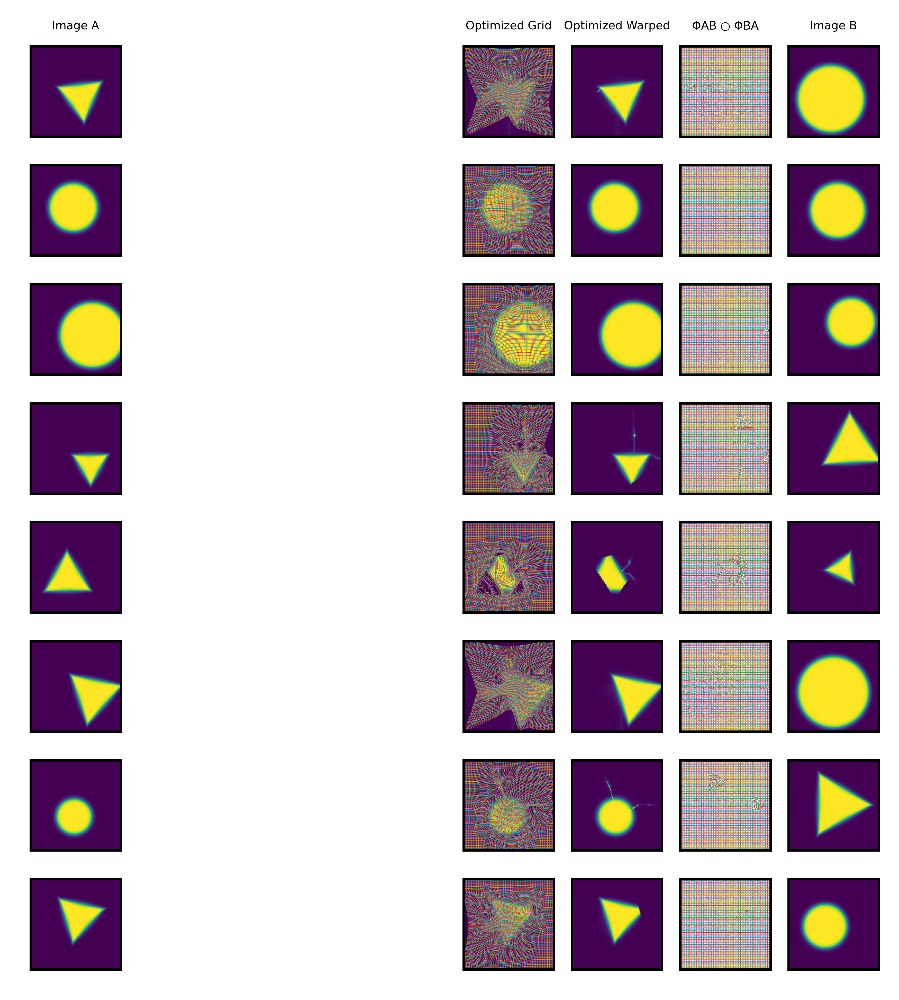

In [9]:
net_nolearning.noise = 0
net_nolearning(image_A[:8], image_B[:8])
wdth = 9
plt.figure(dpi=800, figsize=(6, 6))
plt.rcParams.update({'axes.titlesize': 4, 'text.usetex': False})

for row in range(8):
    
    plt.subplot(8, wdth, row * wdth +1)
    if not row:
        plt.title("Image A")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    plt.imshow(image_A[row, 0].cpu())
    
    
    plt.subplot(8, wdth, row * wdth + 5)
    if not row:
        plt.title("Optimized Grid")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    #plt.title("Image B Warped")
    plt.imshow(net_nolearning.warped_image_B.detach().cpu()[row, 0])
    show_as_grid(net_nolearning.phi_AB[row])
    
    plt.subplot(8, wdth, row * wdth + 6)
    if not row:
        plt.title("Optimized Warped")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    plt.imshow(net_nolearning.warped_image_B[row, 0].cpu().detach())
    
    plt.subplot(8, wdth, row * wdth + 7)
    if not row:
        plt.title("ΦAB ○ ΦBA")
    ax = plt.gca()
    ax.set_aspect("equal")
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    show_as_grid((compute_warped_image_multiNC(net_nolearning.D_BA, net_nolearning.phi_AB, net_nolearning.spacing, 1) + net_nolearning.phi_AB)[row])
    
    plt.subplot(8, wdth, row * wdth + 8)
    if not row:
        plt.title("Image B")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    plt.imshow(image_B[row, 0].cpu())
    

plt.show()

In [ ]:
    visualizeRegistrationCompact?


In [ ]:
nolearning_history = _

In [15]:
net_nolearning.D_BA.shape

torch.Size([8, 2, 128, 128])

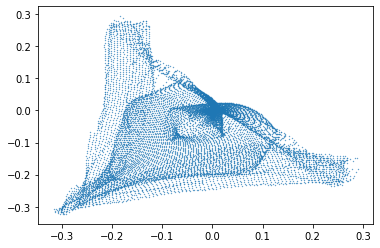

In [106]:
if not "N" in locals():
    N = -1
N += 1
N %= 8
x = torch.reshape(net_nolearning.D_BA[N,0, :, :], [128 * 128]).cpu().detach()
y = torch.reshape(net_nolearning.D_BA[N,1, :, :], [128 * 128]).cpu().detach()
plt.scatter(x, y, s=.1)

In [76]:
N

False

In [77]:
del N

In [10]:
net_nolearning_0 = InverseConsistentLearningFree(2048, noise=0)
optimizer_nolearning_0 = torch.optim.Adam(net_nolearning_0.parameters(), lr=.0001)
net_nolearning_0.train().cuda()
train_no_learning(net_nolearning_0, optimizer_nolearning_0, image_A[:8], image_B[:8])

[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[]


[[0.0, 1.3630889654159546, 0.0, tensor(-2.3026)],
 [1.3088380001136102e-05,
  1.361436367034912,
  5.301646979205543e-06,
  tensor(-2.3026)],
 [2.503455471014604e-05,
  1.3597960472106934,
  1.9756487745326012e-05,
  tensor(-2.3026)],
 [3.4299519029445946e-05,
  1.3581568002700806,
  4.3720603571273386e-05,
  tensor(-2.3026)],
 [4.64337645098567e-05,
  1.356523036956787,
  7.80698173912242e-05,
  tensor(-2.3026)],
 [6.060879968572408e-05,
  1.3548942804336548,
  0.0001227243192261085,
  tensor(-2.3026)],
 [7.189445022959262e-05,
  1.3532710075378418,
  0.0001775226992322132,
  tensor(-2.3026)],
 [8.419806545134634e-05,
  1.3516532182693481,
  0.0002427063009236008,
  tensor(-2.3026)],
 [9.70550172496587e-05,
  1.3500412702560425,
  0.0003184640081599355,
  tensor(-2.3026)],
 [0.00011093984358012676,
  1.348435401916504,
  0.0004047534894198179,
  tensor(-2.3026)],
 [0.00012404308654367924,
  1.3468360900878906,
  0.0005014960770495236,
  tensor(-2.3026)],
 [0.0001373762934235856,
  1.3

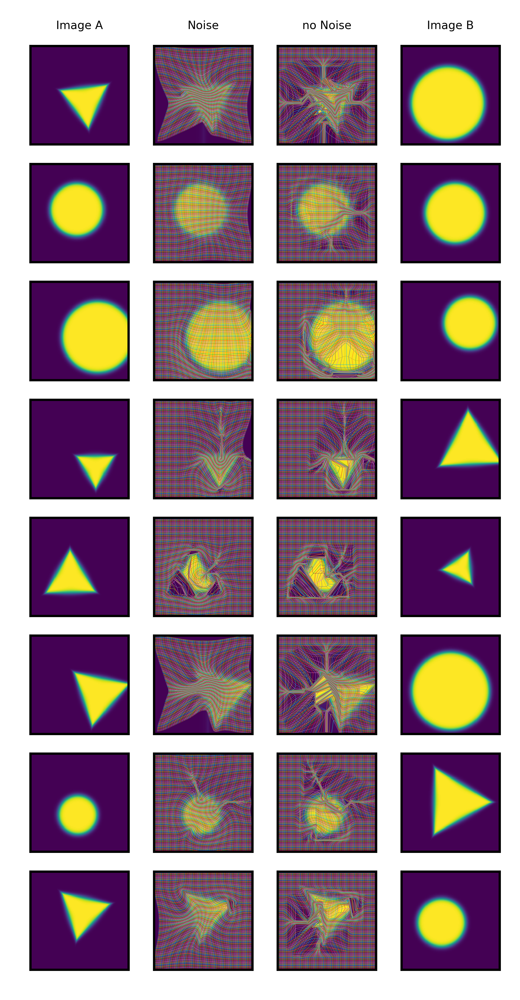

In [11]:
net_nolearning.noise = 0
net_nolearning(image_A[:8], image_B[:8])
net_nolearning_0(image_A[:8], image_B[:8])
wdth = 4
plt.figure(dpi=800, figsize=(3, 6))
plt.rcParams.update({'axes.titlesize': 4, 'text.usetex': False})

for row in range(8):
    
    plt.subplot(8, wdth, row * wdth +1)
    if not row:
        plt.title("Image A")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    plt.imshow(image_A[row, 0].cpu())
    
    
    plt.subplot(8, wdth, row * wdth + 2)
    if not row:
        plt.title("Noise")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    #plt.title("Image B Warped")
    plt.imshow(net_nolearning.warped_image_B.detach().cpu()[row, 0])
    show_as_grid(net_nolearning.phi_AB[row])
    
    plt.subplot(8, wdth, row * wdth + 3)
    if not row:
        plt.title("no Noise")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    #plt.title("Image B Warped")
    plt.imshow(net_nolearning_0.warped_image_B.detach().cpu()[row, 0])
    show_as_grid(net_nolearning_0.phi_AB[row])
    
    
    
    plt.subplot(8, wdth, row * wdth + 4)
    if not row:
        plt.title("Image B")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    plt.imshow(image_B[row, 0].cpu())
    

plt.show()